# $Re = 720$ $Bo = 200$ $akHs = 0. 16$ $u*/c = 0.50$ $Re_{w} = 1.0e5$ $MaxLevel = 10$

In [23]:
# Librerías estándar y de terceros
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
from scipy import *
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
from scipy.interpolate import interp1d

import pylab
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 33,
         'axes.titlesize':33,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral',  
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, 
}

pylab.rcParams.update(params)
sys.path.append('/projects/DEIKE/cmartinb/functions')
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 

os.chdir('/projects/DEIKE/cmartinb/')

### Load the case 

In [24]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p08' # 0p16 
uoc = '0p25' # 0p50 0p75
reW = '1.0e5'
reA = 720
maxLevel = 10
Bo=200

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

if uoc == '0p75':
    N = 1024
else:
    N = 512 

#Common parameters 
kp = 4
u = 0.5
lambdap = 2*m.pi/kp

L0 = 2*np.pi;


ak, c, omegap, nu_water, g , uoc_val= calculate_parameters(kpHs, uoc , u ,kp)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)

ak is 0.08 c is 2.0 w_p$ is 4.0 $
u_w$ is 0.0001256637061435917 g is 4 N 512


In [25]:
work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
data = np.loadtxt(work_dir+'eta/global_int.out')
#re720_bo0200_P0p16_uoc0p50_reW1.0e5_L10
istep_c =data[:, 1]
time = data[:,0] 
print(time.shape)

(397,)


## Constants to define depending on the case

In [26]:
#L0 = 2*np.pi; N = 512;
tstart = time[0]
#kp = 4; omegap = (1*kp)**0.5

#### Function to do only once when post-processing a case, it removes drops and bubbles and save the post-processed file in a dara frame called eta_series_{}

In [27]:
'''
eta_series = np.zeros((istep_c.shape[0],N,N), dtype=np.float32)
j=0
for i in istep_c:
    
    filename = work_dir + f'eta/eta_loc/eta_loc_t{int(i):09}.bin'
    etalo = np.fromfile(filename)
    size  = etalo.shape;
    tot_row = 18
    tot_row_i = int(size[0]/tot_row);
    etalo = etalo.reshape([tot_row_i, tot_row]);
    
    eta_m0  = 1.0; cirp_th = 0.20;
    new_row = 0;
    for i in range(tot_row_i):
        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):
            new_row += 1;
    #
    print('iteration', j ,"Second pass of remove")
    etal = np.zeros([new_row, 18]);
    for i in range(new_row):
        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):
            etal[i][:] = etalo[i][:];
    xarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation
    yarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation
    xtile, ytile = np.meshgrid(xarray,yarray)
    eta = griddata((etal[:,0].ravel(), etal[:,1].ravel()), etal[:,12].ravel(), (xtile, ytile), method='nearest')
    eta_series[j]= eta
    j+=1
#np.save(f'/projects/DEIKE/cmartinb/eta/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', eta_series)
'''

'\neta_series = np.zeros((istep_c.shape[0],N,N), dtype=np.float32)\nj=0\nfor i in istep_c:\n    \n    filename = work_dir + f\'eta/eta_loc/eta_loc_t{int(i):09}.bin\'\n    etalo = np.fromfile(filename)\n    size  = etalo.shape;\n    tot_row = 18\n    tot_row_i = int(size[0]/tot_row);\n    etalo = etalo.reshape([tot_row_i, tot_row]);\n    \n    eta_m0  = 1.0; cirp_th = 0.20;\n    new_row = 0;\n    for i in range(tot_row_i):\n        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):\n            new_row += 1;\n    #\n    print(\'iteration\', j ,"Second pass of remove")\n    etal = np.zeros([new_row, 18]);\n    for i in range(new_row):\n        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):\n            etal[i][:] = etalo[i][:];\n    xarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation\n    yarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation\n    xtile, ytile = np.meshgrid(xarray,yarray)\n    eta = griddata((etal[:

## Load data for eta, eta series is (t, x, y) so it has dimensions $(T_f, N_x, N_y)$

In [28]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
print(eta_series.shape)

(490, 512, 512)


#### Remove first 10 times so we only focus in growth

In [29]:
'''
Already saved properly
tstart = time[0]
indice = np.argmax(omegap*(time - tstart) > 10)
#print(indice)

eta_series_trimmed = eta_series[indice:, :]

#print(eta_series_trimmed.shape)
time = time[indice:]

eta_series = eta_series_trimmed
#print(time.shape)
'''

'\nAlready saved properly\ntstart = time[0]\nindice = np.argmax(omegap*(time - tstart) > 10)\n#print(indice)\n\neta_series_trimmed = eta_series[indice:, :]\n\n#print(eta_series_trimmed.shape)\ntime = time[indice:]\n\neta_series = eta_series_trimmed\n#print(time.shape)\n'

# $\eta(x,y)$

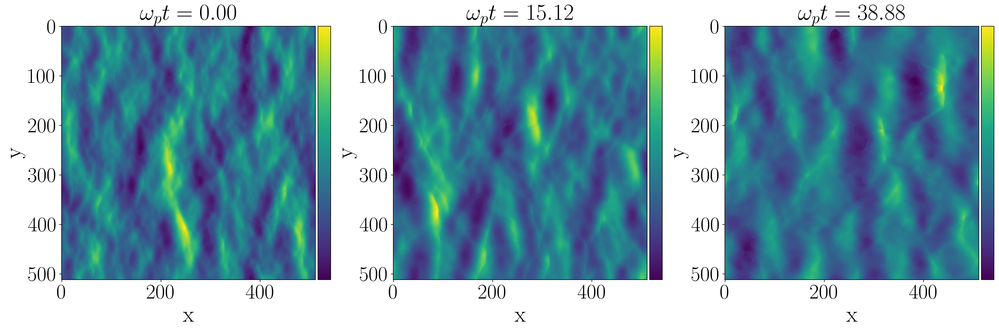

In [30]:
ind_time = [0,154,-1] #index of the times we are interested in (depends on length of time) 
num_rows = 1
num_cols = 3

kp = 4; omegap = (1*kp)**0.5

tstart=time[0]


fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 13))
j = 0

N = 512
L = 2 * np.pi


for i in ind_time:
    eta = eta_series[i]
    
    #vmin = 0
    #vmax = 5
    #levels = np.linspace(vmin, vmax, 1000)
    
    ax = axes[j % num_cols]
    im = ax.imshow(eta)  
    
    ax.set_aspect('equal')
    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart)))
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False')

    
    #cbar = fig.colorbar(im, ax=axs, pad=0.04, orientation='vertical',  extendrect = 'False', shrink= 0.6)
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    j += 1



plt.tight_layout()
plt.show()

# $E(k_x, k_y)$

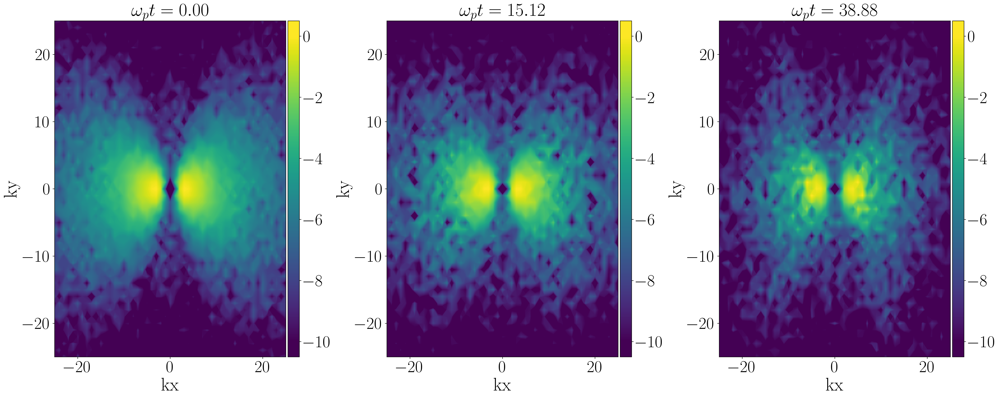

In [31]:
num_rows = 1
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 10))
j = 0

N = 512
L = 2 * np.pi
lim = 200

for i in ind_time:
    
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, variance, integral, polar_integral, kx, ky = spectrum_integration(eta - np.mean(eta), N, L, CHECK=False) #ypu can chose to check the normalization
    
    norm = np.argmax(F_center)
    
    vmin = -10
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j % num_cols]
    
    im = ax.contourf(kx, ky, np.log(F_center/np.max(F_center)), extend='both', levels=levels)
    
    #ax.set_aspect('equal')
    ax.set_title(label=r'$\omega_{p} t=%.2f$' % (omegap * (time[i] - tstart)))
    ax.set_xlabel('kx')
    ax.set_ylabel('ky')
    ax.set_ylim([-25, 25])
    ax.set_xlim([-25, 25])
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False')
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    #cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    j += 1
    
plt.tight_layout()
plt.show()


# $E(k, \theta)$

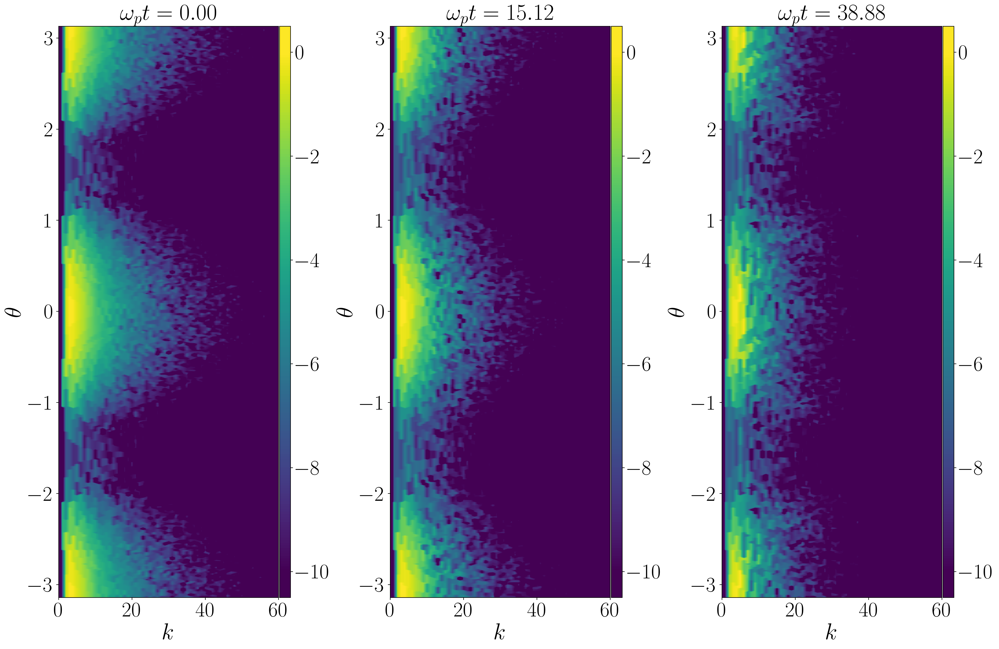

In [32]:
num_rows = 1
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 13))
j = 0

variance =[]
integral = []
polar_integral = []

for i in ind_time:
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated , F_center_polar , k_tile, kxp_tile, kyp_tile , theta_tile , theta , variance, integral, polar_integral , kx, ky = spectrum_integration(eta-np.mean(eta), N,L,CHECK=False)
    
    vmin = -10
    vmax= 0
    levels = np.linspace(vmin, vmax, 200)
    
    
    plt.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels,  extend='both' )#, cmap='viridis')
    
    ax = axes[j % num_cols]

    im = ax.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels ,  extend='both')#, cmap='viridis')
    
    
    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart)))
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.02)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False', fraction = 0.05, pad = 0.02,aspect =10)
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    #cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    ax.set_xlim([0,60])
    ax.set_xlabel('$k$')
    ax.set_ylabel(r"$ \theta $")
    j += 1
    

plt.tight_layout()
#plt.savefig("g1_tend", dpi=300)
plt.show()

# $E(k,t)$

/tmp/ipykernel_2152474/1582130662.py:105: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim([0,10])


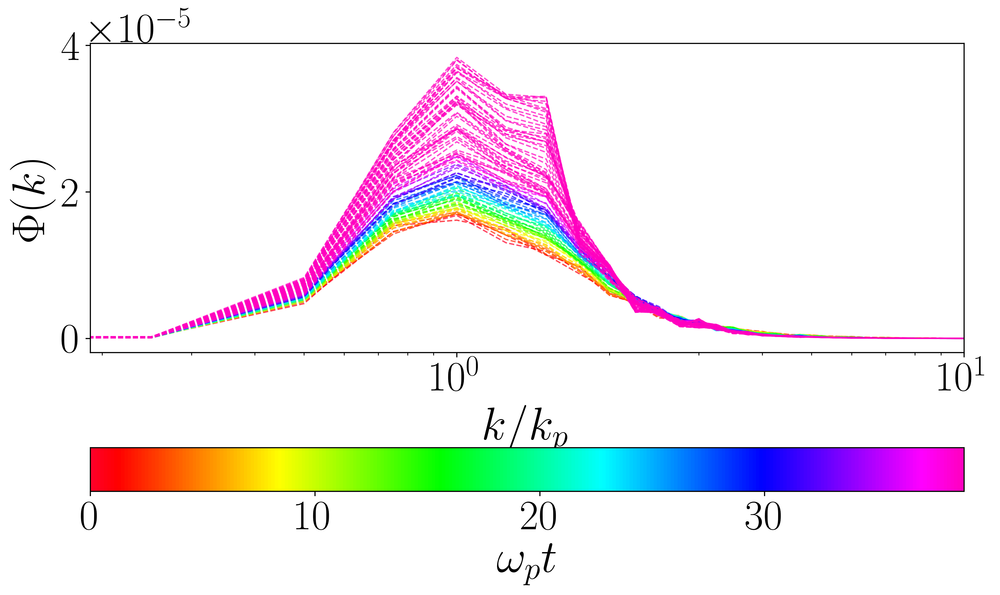

In [33]:
color_map = plt.cm.gist_rainbow
fig = plt.figure(figsize=(10, 6))
ax = fig.gca()

num_rows = 2
num_cols = 3

kp = 4

N = 512
L = 2 * np.pi

j = 0

variance = []
integral = []
polar_integral = []

# modes growth
energy_mode = []
coordx_mode = []
k_second = []

energy_secondmode = []
coordx_secondmode =[]
pylab.rcParams.update(params)

filtered_coordx_mode = []
filtered_energy_mode = []

#Loop in time


for i in range(len(eta_series)):
    eta = eta_series[i]
    #print(i, variance)
    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, varr, integ, int_pol , kx, ky = spectrum_integration(
        eta - np.mean(eta), N, L, CHECK=False)
    #print('k', k, 'kx', kx[int(len(kx)/2):])
    #k = kx[int(len(kx)/2):]
    dk = k[1] - k[0]
    
    #print(k)
    if i == 0:

        indices1 = np.arange(0, np.where(k >= 1)[0][0], max(1, int(0.25 / dk)))
        indices10 = np.arange(np.where(k >= 1)[0][0], np.where(k >= 10)[0][0], max(1, int(1 / dk)))
        indices1020 = np.arange(np.where(k >= 10)[0][0], np.where(k > 40)[0][0], max(1, int(1 / dk)))
        indices100 = np.arange(np.where(k >= 20)[0][0], np.where(k > 100)[0][0], max(1, int(10/ dk)))
        indicesplus = np.arange(np.where(k >= 100)[0][0], len(k), max(1, int(20 / dk)))

        k_multiples = np.concatenate((indices1, indices10, indices1020 ,indices100, indicesplus))

        k_multiples = k_multiples.astype(int)
        # Obtener los valores de k y las energías correspondientes
        k_seleccionados = k[k_multiples]

    energias_correspondientes = F_center_polar_integrated[k_multiples]
    #k = k/4
    
    if i == 0:
        E0_both = np.sum(F_center_polar_integrated) * dk
        #print(type(indices_cada_diez))
        E0_nodes_both = F_center_polar_integrated[k_multiples]
        #E0_second_both =  F_center_polar_integrated[k_second]
    
    if i % 5 == 0:
        psd = ax.plot(k/4, F_center_polar_integrated, '--', color=plt.cm.get_cmap('gist_rainbow')(j), alpha=0.7, linewidth=1)
    
    energy_mode.append(energias_correspondientes.tolist())
    #coordx_mode.append(coordx.tolist())
    integral.append(integ)
    variance.append(varr)
    polar_integral.append(int_pol)
 
    j += 1

# plot where are the nodes

#for km in k_seleccionados:
    #plt.axvline(x=km, color='gray', linestyle='--', linewidth=0.3)
    
#ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
#plt.legend(loc='upper right', fontsize=4)


color_values =  (omegap*(np.array(time)-time[0]))

# Now set the normalization with the correct range

norm = plt.Normalize(vmin=color_values.min(), vmax=color_values.max())
sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
sm.set_array([])  

# Add the colorbar to the figure
cbar = plt.colorbar(sm, orientation='horizontal', pad=0.2)

# Set colorbar label and other properties if needed
cbar.set_label('$\omega_{p} t$')


fig.tight_layout()
cbar.set_label('$\omega_{p} t$')
plt.xscale('log')
plt.xlim([0,10])
#plt.ylim([10**-11,10**-3])
#plt.yscale('log')
plt.xlabel('$\mathdefault{k/k_{p}}$')
plt.ylabel('$\mathdefault{\Phi(k)}$')
fig.tight_layout()

### The following saves in DataFrame energies like the followimg df = ['i', 'k_start', 'k_end', 'F_integral_interval', 'omegat'], look in compare_growthcont.ipynb for example of use.

IndexError: index 397 is out of bounds for axis 0 with size 397

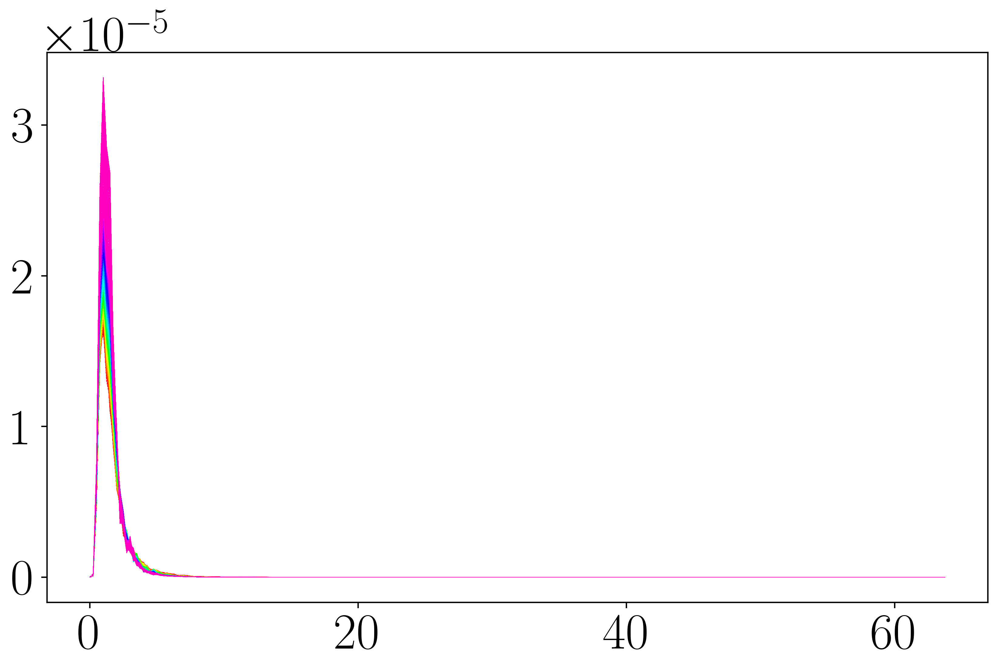

In [34]:
from scipy.interpolate import interp1d
from scipy import integrate
import csv

fig = plt.figure(figsize=(10, 6))
color_map = plt.cm.gist_rainbow
ax = fig.gca()

num_rows = 2
num_cols = 3

kp = 4

N = 512
L = 2 * np.pi

j = 0

variance = []
integral = []
polar_integral = []

k_seleccionados =[]

# modes growth
energy_interval_time = []
coordx_mode = []
k_second = []

energy_secondmode = []
coordx_secondmode =[]

F_mode =[]
filtered_coordx_mode = []
filtered_energy_mode = []

E_interval = []

with open(f'/projects/DEIKE/cmartinb/energies/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}_energies.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for i in range(len(eta_series)):

        #recorre el tiempo

        eta = eta_series[i]

        k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, varr, integ, int_pol , kx, ky = spectrum_integration(
            eta - np.mean(eta), N, L, CHECK=False)

        E_interval = []

        #print(i)

        for m in range(41):
            if m == 0:
                # Primer punto
                idx_start, idx_end = 0, 1
            elif m == len(k) - 1:
                # Último punto
                idx_start, idx_end = m - 1, m
            else:
                # Puntos intermedios
                idx_start, idx_end = m - 1, m + 1
                
            F_integral_interval = integrate.trapezoid(F_center_polar_integrated[idx_start:idx_end+1], k[idx_start:idx_end+1])
            
            #print('idx start',idx_start, 'idx end', idx_end )
            
            k_seleccionados.append(k[m]) # lista con la energia de cada intervalo [IN .....IN]

            psd = ax.plot(k/4, F_center_polar_integrated, '--', color=plt.cm.get_cmap('gist_rainbow')(j), alpha=0.7, linewidth=0.3)

            #ax.axvline(x = k[m]/4, color = 'grey', alpha =0.3)
            
            #print('k[idx_start]',k[idx_start],'k[idx_end]', k[idx_end])
            
            #print('i',i,'interval' ,k[idx_start:idx_end+1], 'F_center_polar_integrated',F_center_polar_integrated[idx_start:idx_end+1], 'F ingrated interpol', F_integral_interval,'l',m)

            E_interval.append(F_integral_interval)
            
            writer.writerow([i, m, F_integral_interval, omegap*(time[i]-time[0])])
            
            #f.write(interval_str)
        
        energy_interval_time.append(E_interval) #lista con la energia de todos intervalos para cada tiempo [[I1.... IN]_0.....[IN...IN]_N] en tiempo i

        #writer.writerow(E_interval)
        
        
        j += 1

# plot where are the nodes

for km in k_seleccionados:
    ax.axvline(x=km/4, color='gray', linestyle='--', linewidth=0.3)

ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
#plt.legend(loc='upper right', fontsize=4)


color_values =  (omegap*(np.array(time)-time[0]))

# Now set the normalization with the correct range

norm = plt.Normalize(vmin=color_values.min(), vmax=color_values.max())
sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
sm.set_array([])  

# Add the colorbar to the figure
cbar = plt.colorbar(sm, orientation='horizontal', pad=0.2)

# Set colorbar label and other properties if needed
cbar.set_label('$\omega_{p} t$')


fig.tight_layout()
cbar.set_label('$\omega_{p} t$')
plt.xscale('log')
plt.xlim([0,10])
#plt.ylim([10**-8,1])
plt.yscale('log')
plt.xlabel('$\mathdefault{k/k_{p}}$')
plt.ylabel('$\mathdefault{\Phi(k)}$')
fig.tight_layout()


In [ ]:
df = pd.read_csv(f'/projects/DEIKE/cmartinb/energies/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}_energies.csv', names=['i', 'k', 'F_integral_interval', 'time'])

In [ ]:
# Crear una columna de grupo para cada 'i' que indique el número de intervalo
df['interval_num'] = df.groupby('i').cumcount()

# Ahora pivotar el DataFrame para que cada fila sea una 'i' y cada columna un intervalo
df_pivot = df.pivot(index='i', columns='interval_num', values='F_integral_interval')

# Si deseas que el DataFrame resultante tenga únicamente los valores de integración sin los índices de intervalos como nombres de columnas
df_pivot.columns = [f'interval_{i}' for i in range(len(df_pivot.columns))]

# Resetea el índice para que 'i' sea una columna normal en lugar de un índice
df_pivot = df_pivot.reset_index()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.optimize import curve_fit

# Asumiendo que 'df_pivot' es tu DataFrame y que 'time' y 'k_seleccionados' están definidos
colormap = cm.viridis
normalize = plt.Normalize(vmin=0, vmax=(len(df_pivot.columns) - 2)/4)  # normalizar basado en el número de intervalos

# Crear una figura y un eje para el ploteo
fig, ax = plt.subplots(figsize=(14, 7))

# Definir la función del modelo exponencial
def exp_model(x, a, b):
    return a * np.exp(b * x)

# Crear listas para almacenar los parámetros de crecimiento y decadencia
beta_growth = []
beta_decay = []

k_growth = []
k_decay = []

# Iterar sobre cada intervalo y realizar ajuste exponencial
for idx, column in enumerate(df_pivot.columns[1:]):  # Ignora la primera columna que es 'i'
    # Extraer datos para el intervalo actual
    mode_total_norm = df_pivot[column].dropna()  # Eliminar valores NaN por seguridad
    tiempo_valido = omegap*(time[:len(mode_total_norm)-1]-tstart)  # Asegurar que tiempo y mode_total_norm tengan la misma longitud
    
    mode_total_norm = mode_total_norm[:-1]
    
    # Ajuste exponencial solo si todos los valores son positivos y hay suficientes datos
    if len(mode_total_norm) > 1 and np.all(mode_total_norm > 0):
        popt, pcov = curve_fit(exp_model, tiempo_valido, mode_total_norm, p0=(1, 0.001), maxfev=100000)
        a, b = popt
        if b > 0:
            beta_growth.append(b)
            k_growth.append(idx)
        else:
            beta_decay.append(b)
            k_decay.append(idx)
        
        # Realizar gráfico para cada intervalo
        color = cm.viridis(idx / len(df_pivot.columns[1:]))  # Normalizar color
        ax.scatter(tiempo_valido, mode_total_norm, color=color, s=10)
        ax.plot(tiempo_valido, exp_model(tiempo_valido, *popt), color=color, lw=2)

# Configurar gráfico
ax.set_xlabel('Time')
ax.set_ylabel('E(t)')
ax.set_title('Exponential Fit of Integration Over Intervals')
plt.colorbar(cm.ScalarMappable(norm=normalize, cmap=colormap), label='k/kp')
#plt.legend()
plt.show()

# Imprimir los valores de beta para crecimiento y decadencia
print("Growth betas:", beta_growth)
print("Decay betas:", beta_decay)
print("Growth k:", k_growth)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.optimize import curve_fit

# Asumiendo que 'df_pivot' es tu DataFrame y que 'time' y 'k_seleccionados' están definidos
colormap = cm.viridis
normalize = plt.Normalize(vmin=0, vmax=(len(df_pivot.columns) - 2)/4)  # normalizar basado en el número de intervalos

# Crear una figura y un eje para el ploteo
fig, ax = plt.subplots(figsize=(14, 7))

# Definir la función del modelo exponencial
def exp_model(x, a, b):
    return a * np.exp(b * x)

# Crear listas para almacenar los parámetros de crecimiento y decadencia
beta_growth = []
beta_decay = []

k_growth = []
k_decay = []

# Iterar sobre cada intervalo y realizar ajuste exponencial
for idx, column in enumerate(df_pivot.columns[1:]):  # Ignora la primera columna que es 'i'
    # Extraer datos para el intervalo actual
    mode_total_norm = df_pivot[column].dropna()  # Eliminar valores NaN por seguridad
    tiempo_valido = omegap*(time[:len(mode_total_norm)]-tstart)  # Asegurar que tiempo y mode_total_norm tengan la misma longitud
    
    # Ajuste exponencial solo si todos los valores son positivos y hay suficientes datos
    if len(mode_total_norm) > 1 and np.all(mode_total_norm > 0):
        popt, pcov = curve_fit(exp_model, tiempo_valido, mode_total_norm, p0=(1, 0.001), maxfev=10000)
        a, b = popt
        if b > 0:
            beta_growth.append(b)
            k_growth.append(idx)
        else:
            beta_decay.append(b)
            k_decay.append(idx)
        
        # Realizar gráfico para cada intervalo
        color = cm.viridis(idx / len(df_pivot.columns[1:]))  # Normalizar color
        ax.scatter(tiempo_valido, mode_total_norm, color=color, s=10)
        ax.plot(tiempo_valido, exp_model(tiempo_valido, *popt), color=color, lw=2)

# Configurar gráfico
ax.set_xlabel(r'$\omega_{p} t$')
ax.set_ylabel(r'$E_{k}(t)$')
ax.set_title('Evolution energy over time for each mode')
plt.colorbar(cm.ScalarMappable(norm=normalize, cmap=colormap), label='k/kp')
#plt.legend()

plt.yscale('log')

plt.show()
# Imprimir los valores de beta para crecimiento y decadencia
print("Growth betas:", beta_growth)
print("Decay betas:", beta_decay)
print("Growth k:", k_growth)
print("Decay k:", k_decay)

In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))
plt.scatter([k/4 for k in k_growth], [beta/omegap for beta in beta_growth], c='darkblue', marker= "^", label=r'Growth $\omega t$', alpha=0.6, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay], [beta/omegap for beta in beta_decay], c='darkred', marker= "^", label=r'Decay $\omega t$ ', alpha=0.6, edgecolors='w', s=100)
# Añadir etiquetas y título
plt.xlabel(r'$k/k_p$', fontsize=14)
plt.ylabel(r'$\beta / \omega_{p}$', fontsize=14)
plt.title('Growth and Decay Rates by Wavenumber ak = 0.16, u/c =0.5', fontsize=16)
plt.axvline(x=1, color='blue', linestyle='--', linewidth=1, alpha= 0.4,  label=r'$k/k_{p}=1$')
# Añadir leyenda
plt.legend()

# Añadir cuadrícula para mejor visualización
plt.grid(True)

# Ajustar límites si es necesario
#plt.xlim([-0.2, 0.2])
plt.ylim([-0.008, 0.008])

# Mostrar el gráfico
plt.show()

## Comparaison with other Reynolds number (w)

In [ ]:
df_beta_kpHs016_upc05 = pd.read_csv('/projects/DEIKE/cmartinb/betas/betas_re720_bo0200_P0p16_uoc0p50_reW2.5e4_L10_.csv')

df_growth_kpHs016_upc05 = df_beta_kpHs016_upc05[df_beta_kpHs016_upc05['Tipo'] == 'Growth']
df_decay_kpHs016_upc05 = df_beta_kpHs016_upc05[df_beta_kpHs016_upc05['Tipo'] == 'Decay']

k_growth_kpHs016_upc05 = df_growth_kpHs016_upc05['k']
k_decay_kpHs016_upc05 = df_decay_kpHs016_upc05['k']
beta_growth_kpHs016_upc05 = df_growth_kpHs016_upc05['Beta']
beta_decay_kpHs016_upc05 = df_decay_kpHs016_upc05['Beta']

fig, ax = plt.subplots(figsize=(14, 7))
plt.scatter([k/4 for k in k_growth], [beta/omegap for beta in beta_growth], c='navy', marker= "^", label=r'Growth $\omega t$ $Re = 1.05 \cdot 10^{5}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay], [beta/omegap for beta in beta_decay], c='darkred', marker= "v", label=r'Decay $\omega t$  $Re = 1.05 \cdot 10^{5}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_growth_kpHs016_upc05], [beta/omegap for beta in beta_growth_kpHs016_upc05], c='turquoise', marker= "^", label=r'Growth $\omega t$ $Re = 2.5 \cdot 10^{4}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay_kpHs016_upc05], [beta/omegap for beta in beta_decay_kpHs016_upc05], c='deeppink', marker= "v", label=r'Decay $\omega t$  $Re = 2.5 \cdot 10^{4}$', alpha=0.8, edgecolors='w', s=100)
# Añadir etiquetas y título
plt.xlabel(r'$k/k_p$', fontsize=14)
plt.ylabel(r'$\beta / \omega_{p}$', fontsize=14)
plt.title('Growth and Decay Rates by Wavenumber ak = 0.16, u/c =0.5', fontsize=16)
plt.axvline(x=1, color='blue', linestyle='--', linewidth=1, alpha= 0.4,  label=r'$k/k_{p}=1$')
# Añadir leyenda
plt.legend()

# Añadir cuadrícula para mejor visualización
plt.grid(True)

# Ajustar límites si es necesario
#plt.xlim([-0.2, 0.2])
plt.ylim([-0.008, 0.008])

# Mostrar el gráfico
plt.show()



In [20]:
# Leer el archivo existente y extraer los datos de growth y decay
df_beta_kpHs016_upc05 = pd.read_csv('/projects/DEIKE/cmartinb/betas/betas_re720_bo0200_P0p16_uoc0p50_reW2.5e4_L10.csv')

df_growth_kpHs016_upc05 = df_beta_kpHs016_upc05[df_beta_kpHs016_upc05['Tipo'] == 'Growth']
df_decay_kpHs016_upc05 = df_beta_kpHs016_upc05[df_beta_kpHs016_upc05['Tipo'] == 'Decay']

k_growth_kpHs016_upc05 = df_growth_kpHs016_upc05['k']
k_decay_kpHs016_upc05 = df_decay_kpHs016_upc05['k']
beta_growth_kpHs016_upc05 = df_growth_kpHs016_upc05['Beta']
beta_decay_kpHs016_upc05 = df_decay_kpHs016_upc05['Beta']

# Leer los archivos CSV de below 50
df_beta_below_50 = pd.read_csv(f'/projects/DEIKE/cmartinb/betas/betas_re720_bo0200_P{kpHs}_uoc{uoc}_below_66.csv')

df_growth_below_50 = df_beta_below_50[df_beta_below_50['Tipo'] == 'Growth']
df_decay_below_50 = df_beta_below_50[df_beta_below_50['Tipo'] == 'Decay']

k_growth_below_50 = df_growth_below_50['k']
k_decay_below_50 = df_decay_below_50['k']
beta_growth_below_50 = df_growth_below_50['Beta']
beta_decay_below_50 = df_decay_below_50['Beta']

# Crear la gráfica
fig, ax = plt.subplots(figsize=(14, 7))
plt.scatter([k/4 for k in k_growth], [beta/omegap for beta in beta_growth], c='navy', marker= "^", label=r'Growth $\omega t$ $Re = 1.05 \cdot 10^{5}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay], [beta/omegap for beta in beta_decay], c='darkred', marker= "v", label=r'Decay $\omega t$  $Re = 1.05 \cdot 10^{5}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_growth_kpHs016_upc05], [beta/omegap for beta in beta_growth_kpHs016_upc05], c='turquoise', marker= "^", label=r'Growth $\omega t$ $Re = 2.5 \cdot 10^{4}$', alpha=0.8, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay_kpHs016_upc05], [beta/omegap for beta in beta_decay_kpHs016_upc05], c='deeppink', marker= "v", label=r'Decay $\omega t$  $Re = 2.5 \cdot 10^{4}$', alpha=0.8, edgecolors='w', s=100)
#plt.scatter([k/4 for k in k_growth_below_50], [beta/omegap for beta in beta_growth_below_50], c='green', marker= "^", label=r'Growth below 50 $\omega t$', alpha=0.8, edgecolors='w', s=100)
#plt.scatter([k/4 for k in k_decay_below_50], [beta/omegap for beta in beta_decay_below_50], c='orange', marker= "v", label=r'Decay below 50 $\omega t$', alpha=0.8, edgecolors='w', s=100)

# Añadir etiquetas y título
plt.xlabel(r'$k/k_p$', fontsize=14)
plt.ylabel(r'$\beta / \omega_{p}$', fontsize=14)
plt.title('Growth and Decay Rates by Wavenumber ak = 0.16, u/c =0.5', fontsize=16)
plt.axvline(x=1, color='blue', linestyle='--', linewidth=1, alpha=0.4, label=r'$k/k_{p}=1$')

# Añadir leyenda
plt.legend()

# Añadir cuadrícula para mejor visualización
plt.grid(True)

# Ajustar límites si es necesario
# plt.xlim([-0.2, 0.2])
plt.ylim([-0.008, 0.008])

#plt.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/Ektheta_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}]_omega{omega[95]/omegap :.2f}.png')

# Mostrar el gráfico
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/projects/DEIKE/cmartinb/betas/betas_re720_bo0200_P0p08_uoc0p50_below_66.csv'

In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))
plt.scatter([k/4 for k in k_growth], [beta/omegap for beta in beta_growth], c='darkblue', marker= "^", label=r'Growth $\omega t$', alpha=0.6, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay], [beta/omegap for beta in beta_decay], c='darkred', marker= "^", label=r'Decay $\omega t$ ', alpha=0.6, edgecolors='w', s=100)
# Añadir etiquetas y título
plt.xlabel(r'$k/k_p$', fontsize=14)
plt.ylabel(r'$\beta / \omega_{p}$', fontsize=14)
plt.title('Growth and Decay Rates by Wavenumber ak = 0.16, u/c =0.5', fontsize=16)
plt.axvline(x=1, color='blue', linestyle='--', linewidth=1, alpha= 0.4,  label=r'$k/k_{p}=1$')
# Añadir leyenda
plt.legend()

# Añadir cuadrícula para mejor visualización
plt.grid(True)

# Ajustar límites si es necesario
#plt.xlim([-0.2, 0.2])
plt.ylim([-0.008, 0.008])

# Mostrar el gráfico
plt.show()

#### Save betas in Data Frame so we can compare different cases

In [ ]:
import pandas as pd
import numpy as np

# Creation Df for growth and decay
df_growth = pd.DataFrame({
    'Tipo': 'Growth',
    'Beta': beta_growth,
    'k': k_growth
})

df_decay = pd.DataFrame({
    'Tipo': 'Decay',
    'Beta': beta_decay,
    'k': k_decay
})

df_beta = pd.concat([df_growth, df_decay], axis=0).reset_index(drop=True)

# Guardar el DataFrame combinado en un archivo CSV
df_beta.to_csv('betas_re720_bo0200_P0p16_uoc0p50_reW1.0e5_L10_.csv', index=False)

#### This code is for seeing growth energy for different modes separately

In [ ]:
beta_growth = []
beta_decay = []
k_growth = []
k_decay = []

tiempos_minimos = []
kp_minimos = []

sse_values =[]
r2_values =[]

slopes_exp =[]
slopes_exp_decay =[]

for idx, column in enumerate(df_pivot.columns[1:]):
    mode_total_norm = df_pivot[column].values
    # Start a new figure for each mode
    fig, ax = plt.subplots(figsize=[5, 3])
    color = cm.viridis(idx / len(df_pivot.columns[1:]))
    
    
    tiempo = omegap*(time-tstart)
    
    ax.plot(tiempo, mode_total_norm, '-', color=color, lw=0.5, label=f'mode k/kp = {idx/kp:.2f}')
    ax.scatter(tiempo, mode_total_norm, color=color, s=0.5, alpha=0.7)
    
    # Exponential fit
    p = np.polyfit(tiempo, np.log(mode_total_norm), 1)
    a = np.exp(p[1])
    b = p[0]
    y_exponential = a * np.exp(b * tiempo)
    
    slope = b
    
    concavity = "upwards" if b > 0 else "downwards"
    
    # Calculate SSR and R^2 for exponential fit
    residuals_exp = mode_total_norm - y_exponential
    ssr_exp = np.sum(residuals_exp ** 2)
    sst_exp = np.sum((mode_total_norm - np.mean(mode_total_norm)) ** 2)
    r2_exp = 1 - (ssr_exp / sst_exp)
    
    if r2_exp > 0.8:
    
        if b>0:
            print('1')
            beta_growth.append(b)
            k_growth.append(idx / kp)
            print(idx / kp)
        else:
            print('2')
            beta_decay.append(b)
            k_decay.append(idx / kp)
            print(idx / kp)
    
    # Append to lists
    sse_values.append(ssr_exp)
    r2_values.append(r2_exp)
    
    # Check if the R^2 value is below the threshold
    if r2_exp < 0.8:
        #print('entra')
        # Perform a parabolic fit
        #print('tiempo', tiempo)
        coefficients_parabola = np.polyfit(tiempo, mode_total_norm, 2)
        y_parabola = np.polyval(coefficients_parabola, tiempo)
        
        a_parabola, b_parabola, c_parabola = coefficients_parabola
        
        concavity = "upwards" if a > 0 else "downwards"
        
        if a != 0:  # a different of zero so we don't divide by zero
            x_minimo = - b_parabola / (2 * a_parabola) 
            print('x minimo',x_minimo)
            y_minimo = np.polyval(coefficients_parabola, x_minimo)
            if (x_minimo>tiempo[0]) & (x_minimo<tiempo[-1]):
                plt.plot(x_minimo, y_minimo, 'go', label='Minimum')
        else:
            x_minimo = None
            y_minimo = None

        concavity = "upwards" if a_parabola > 0 else "downwards"
        
        # verify is critical point is in the proper interval
        if x_minimo > tiempo[0] and x_minimo < tiempo[-1]:
            # Divide data around this critical point 
            left_mask = tiempo < x_minimo
            right_mask = tiempo > x_minimo
            
            if left_mask.any():
                p_left = np.polyfit(tiempo[left_mask], np.log(mode_total_norm[left_mask]), 1)
                a_left = np.exp(p_left[1])
                b_left = p_left[0]
                y_left_exp = a_left * np.exp(b_left * tiempo[left_mask])
                ax.plot(tiempo[left_mask], y_left_exp, 'm--', label='Left exponential fit')
                if b_left > 0:
                    beta_growth.append(b_left)
                    k_growth.append(idx / kp)
                else:
                    beta_decay.append(b_left)
                    k_decay.append(idx / kp)

            # Right segment
            if right_mask.any():
                p_right = np.polyfit(tiempo[right_mask], np.log(mode_total_norm[right_mask]), 1)
                a_right = np.exp(p_right[1])
                b_right = p_right[0]
                y_right_exp = a_right * np.exp(b_right * tiempo[right_mask])

                if b_right > 0:
                    beta_growth.append(b_right)
                    k_growth.append(idx/ kp)
                else:
                    beta_decay.append(b_right)
                    k_decay.append(idx / kp)

                
                ax.plot(tiempo[right_mask], y_right_exp, 'y--', label='Right exponential fit')
        else: # If not take exp fit 
            if b>0:
                print('7')
                beta_growth.append(b)
                k_growth.append(idx / kp)
                print(idx/ kp)
                    
            else:
                print('8')
                beta_decay.append(b)
                k_decay.append(idx/ kp)
                print(idx / kp)
           
        # Calculate residuals for the parabolic fit
        residuals_parabola = mode_total_norm - y_parabola
        rmse = np.sqrt(np.mean(residuals_parabola**2))
        
        ssr_parab= np.sum(residuals_parabola ** 2)
        sst_parab = np.sum((mode_total_norm - np.mean(mode_total_norm)) ** 2)
        r2_parab = 1 - (ssr_parab / sst_parab)
        
        # Plot the parabolic fit
        plt.plot(tiempo, y_parabola, 'b--', label='Parabolic fit')
        ax.plot(tiempo, y_exponential, 'r--', label='Exponential fit')
        plt.legend()
        #plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('$\omega_{p} t$')
        plt.ylabel('$E(t)$')
        
        
        x0, xmax = plt.xlim()
        y0, ymax = plt.ylim()
        data_width = xmax - x0
        data_height = ymax - y0
        plt.text(x0 + 0.1, y0+0.000000001, f'$t \omega$ = {x_minimo:2f}')
        
        tiempos_minimos.append(x_minimo)
        kp_minimos.append(idx/kp)
        
        plt.show()
        # Print the results
        print(f'Parabolic fit: k/kp = {idx/kp:.2f},SSE = {ssr_parab:.2e}, R^2 = {r2_parab:.5f}', r'time where behaviour changes $\omega t$', x_minimo )
        print(f'RMSE of parabolic fit: {rmse:.5f}')
        print('a',a,'b',b)

        
    else:
        ax.plot(tiempo, y_exponential, 'r--', label='Exponential fit')
    
    print(beta_growth,beta_decay,k_growth,k_decay)
    
    ax.set_xlabel('$\omega_{p} t$')
    ax.set_ylabel('$E(t)$')
    ax.set_yscale('log')
    #ax.set_xscale('log')
    ax.legend(fontsize="7")
    ax.grid(True)
    plt.show()
    
    print(f'Exponential fit: k/kp = {idx/kp:.2f}, slope = {slope:.5f}, SSE = {ssr_exp:.2e}, R^2 = {r2_exp:.5f}')

    if slope < 0:
        slopes_exp_decay.append(slope)
        k_decay.append(idx)
    
    slopes_exp.append(slope)

#### Here we save a file with times and k caracteristic: where behavior is only the first, not changing the behavior.

In [ ]:
fig = plt.figure(figsize=[5, 3])
plt.scatter(kp_minimos,tiempos_minimos, s =6, marker ="*", color='black')
#plt.axhline(y = 80, color = 'r', linestyle = '--', lw = 0.3) 
#plt.axhline(y = 0, color = 'r', linestyle = '--', lw = 0.3) 
plt.ylabel(r'$t^{*}$')
plt.xlabel(r'$k/k_{p}$')
plt.ylim([20,100])
plt.xlim([5.4,10])


# Crear un DataFrame con los datos
df_datos = pd.DataFrame({
    'kp_minimos': kp_minimos,
    'tiempos_minimos': tiempos_minimos
})

# Guardar en CSV
df_datos.to_csv('datos_re720_bo0200_P0p16_uoc0p50_reW1.0e5_L10.csv', index=False)

# 3D - Spectra

In [ ]:
print(eta_series.shape[0])
data = eta_series
#print(eta_series[4])
kp = 4; omegap = (1*kp)**0.5

In [ ]:
def spectrum3D_subdivisions(DataEta, time, ln):
    '''
    Compute 3D Fourier Transform in Space and Time over subdivisions of length ln
    in DataEta and calculate different spectra.
    
    DataEta: list with eta (2D) at different times.
    time: vector time associated with this eta.
    ln: length of subdivisions in DataEta.
    '''

    dt = time[1] - time[0]  # Sampling intervals, (s)
    T = time[-1] - time[0]  # Total duration
    
    L0 = 2 * np.pi
    N = 512  # Domain size and grid number in each direction
    
    dx = L0 / N  # Spatial sampling step along X in (m)
    dy = L0 / N  # Spatial sampling step along Y in (m)
    
    # Initialize lists to store spectra for each subdivision
    all_F_xyomega = []
    all_F_kthetaomega = []
    all_F_komega = []
    all_F_ktheta = []
    hann_window = np.hanning(ln)
    #print(dt)
    #F_xyomega = np.zeros((N, len(time), N))
    #F_kthetaomega = np.zeros((len(theta), len(time), len(k)))
    #F_komega = np.zeros((len(k),len(time)))  # Dimension k x omega
    #print('length loop', range(0, len(DataEta), ln))
    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    # Process each subdivision of length ln
    for start_idx in range(0,len(DataEta) - overlap, ln - overlap):
        end_idx = start_idx + ln
        #Data_pad = np.pad(DataEta, 1, mode='constant')
        print('interval time idx' ,start_idx, end_idx)
        time_subdivision = np.array(time[start_idx:end_idx])
        #print('tw/Tp', omegap*(time_subdivision - time[0])/(2*np.pi))
        data_subdivision = np.array(DataEta[start_idx:end_idx])
        
        if end_idx > len(DataEta):
            # In this case, we can choose to either skip the last window or include it with padding.
            # Let's choose to skip for now.
            break
        
        for i in range(data_subdivision.shape[1]):  # Loop over the second dimension
            for j in range(data_subdivision.shape[2]):  # Loop over the third dimension
                data_subdivision[:, i, j] *= hann_window
        

        dt = time_subdivision[1] - time_subdivision[0]
        
        T = time_subdivision[-1] - time_subdivision[0] 
        x_max = dx * data_subdivision.shape[2]
        y_max = dy * data_subdivision.shape[1]
        
        # Frequencies and wavenumbers for the subdivision
        omega = 2 * np.pi * np.fft.fftshift(np.fft.fftfreq(data_subdivision.shape[0], dt))
        wavenumber = 2 * np.pi * np.fft.fftfreq(N, L0 / N)
        theta = np.linspace(0, 2 * np.pi, N)  # Assuming N points for theta as well
        kx = np.fft.fftshift(wavenumber)
        ky = kx
        k = wavenumber#[0:int(N/2)] #only k>0
        #omega = omega[int(Nt/2):] #only freq>0
        
        spectrum3D = np.fft.fftn(data_subdivision / (N**3))  # FFT normalization for the subdivision
        spectrum3D = np.fft.fftshift(spectrum3D, axes=(0, 1, 2))
        #print('spectrum shape',spectrum3D.shape)
        
        # Compute power spectrum for the subdivision
        dkx = kx[1] - kx[0]
        dky = ky[1] - ky[0]
        domega = omega[1] - omega[0] if len(omega) > 1 else omega[0]  # Handle case with single omega value
        F_3D = (np.absolute(spectrum3D))**2 / (N**2) / ln / (dkx * dky * domega**2)
        #print('intervalo', start_idx, 'F3D' , F_3D.shape)

        kx_tile, ky_tile = np.meshgrid(kx, ky)  # kx-ky space
        k_tile, theta_tile = np.meshgrid(k, theta)  # k-theta space
        kxp_tile, kyp_tile = pol2cart(k_tile, theta_tile)
        Omega, K = np.meshgrid(omega, k) # k-omega space
        
        
        F_xy_interval=[]
        F_komega_interval =[]
        F_ktheta_interval = []
        for i in range(ln):  # Loop over the frequencies (omega)
            F_xy = F_3D[i]#, 512:,:-512]  # Spectrum F(kx,ky) for each (512,512) in the interval
            #print(kx_tile.shape, ky_tile.shape,F_xy.shape, kxp_tile.shape, kyp_tile.shape )
            #F_yomega[:, i, :] = F_xy  # Each column of F_xyomega is a freq
            #F_xyomega[start_idx:start_idx+ln, :, :] = F_3D
            F_ktheta = scipy.interpolate.griddata((kx_tile.ravel(), ky_tile.ravel()), F_xy.ravel(), (kxp_tile, kyp_tile), method='nearest')  # F(omega,kx,ky) --> F(omega,k,theta) for each freq i
            dtheta = theta[1] - theta[0]
            F_komega= np.sum(F_ktheta * k_tile, axis=0) * dtheta  # Integral in theta for each freq i
            
            F_xy_interval.append(F_xy)
            F_komega_interval.append(F_komega)
            F_ktheta_interval.append(F_ktheta)
        # Append the spectra for this subdivision
        all_F_xyomega.append(F_xy_interval)
        all_F_komega.append(F_komega_interval)
        all_F_ktheta.append(F_ktheta_interval)
        
        #print('all xy omega', np.array(all_F_xyomega).shape)

    return k , omega,  k_tile, theta_tile, kx, kx_tile, ky_tile , all_F_xyomega, all_F_komega, Omega, K , all_F_ktheta, kxp_tile, kyp_tile

In [ ]:
ln = 150
k , omega,  k_tile, theta_tile, kx,  kx_tile, ky_tile , all_F_xyomega, all_F_komega,  Omega, K , all_F_ktheta , kxp_tile, kyp_tile = spectrum3D_subdivisions(data, time, ln)

In [ ]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (3, 3),
         'axes.labelsize': 16,
         'axes.titlesize':16,
         'xtick.labelsize':16,
         'ytick.labelsize':16}
pylab.rcParams.update(params)


colormap = cm.viridis
normalize = plt.Normalize(vmin=0, vmax=(len(df_pivot.columns) - 2)/4)  # normalizar basado en el número de intervalos

array = np.array(all_F_xyomega) # Esto toma la primera subdivisión como ejemplo
print(array.shape)

dt = time[1] - time[0]
overlap_factor =0.5
overlap = int(ln * overlap_factor)
# Calcula la duración de cada intervalo basado en 'ln' y el intervalo de muestreo 'dt'
start_idx = 0
for i in range(array.shape[0]-1):
    fig, ax = plt.subplots(figsize=(3, 3))
    vmin = -10
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    end_idx = start_idx + ln 
    im = plt.contourf(kx_tile/4, ky_tile/4, np.log(array[i,81,:, :] / np.max(array[i,81,:, :])), levels=levels, extend='both')
    time_subdivision = np.array(time[start_idx:end_idx])
    #print(time_subdivision- time[0])
    #print('interval time', time_subdivision - time[0])
    
    # Calculate the end index of the current interval
    end_idx = start_idx + ln
    # Ensure don't exceed the time array
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    
    #plt.ylim([-10, 10])
    #plt.xlim([-10, 10])
    plt.xlabel(r'$k/k_{p}$')
    plt.ylabel(r'$\theta$')

    ax.set_title(f'I = [{(time_subdivision[0]-time[0])*omegap/(2*np.pi):.2f}, '
                 f'{(time_subdivision[-1]-time[0])*omegap/(2*np.pi):.2f}] $(t/T_{{p}})$ $\omega/\omega_p$ = {omega[81]/omegap :.2f}',pad=10)
    
    ax.set_xlim([-10, 10])
    ax.set_ylim([-10, 10])
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin+vmax)/2, vmax])
    cbar.set_label(r'$\Phi(k_{x},k_{y})/max(\Phi(k_{x},k_{y}))$',  labelpad=7)
    plt.show()
    
    # Update start_idx to reflect the overlapping intervals
    start_idx += (ln - overlap)
    # Break the loop if the next start_idx is beyond the array length
    if start_idx >= len(time):
        break

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import gaussian_filter


array = np.array(all_F_ktheta)
print("array shape:", array.shape)

dt = time[1] - time[0]
overlap_factor = 0.5
overlap = int(ln * overlap_factor)


start_idx = 0
for i in range(array.shape[0] - 1):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 100)
    
    end_idx = start_idx + ln
    time_subdivision = np.array(time[start_idx:end_idx])
    #print(time_subdivision - time[0])

    Z = np.log(array[i, 90, :, :] / np.max(array[i, 90, :, :]))  # Data for contourf
    
    Z_smooth = gaussian_filter(Z.T, sigma=1)  # Transpose to match the polar coordinate system
    
    print(Z.shape)
    
    im = ax.contourf(theta , r/4,  Z,   extend='both', levels = levels, cmap='PuRd')
    
    plt.xlabel(r'$k/k_{p}$')
    
    ax.set_title(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, '
                 f'{(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$ $\omega/\omega_p$ = {omega[90] / omegap:.2f}', pad=20)
    ax.set_ylim(0, 10)
    # Colorbar settings
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin + vmax) / 2, vmax])
    cbar.set_label(r'$\Phi(k,\theta)/max(\Phi(k,\theta))$', labelpad=3)
    
    plt.show()
    
    # Update start_idx to reflect the overlapping intervals
    start_idx += (ln - overlap)
    # Break the loop if the next start_idx is beyond the array length
    if start_idx >= len(time):
        break

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.signal import find_peaks
from scipy import stats

# Parámetros de la gráfica
params = {
    'legend.fontsize': 'x-Large',
    'figure.figsize': (14, 6),
    'axes.labelsize': 33,
    'axes.titlesize': 33,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'font.family': 'STIXGeneral',
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True,
}
plt.rcParams.update(params)

Re_water = 2.5 * 10**4
c = 1
nu_water = c * 2 * np.pi / (4 * Re_water)
g = 1
omegap = np.sqrt(g * 4)
all_F_komega = np.array(all_F_komega)
interval_duration = ln * dt
overlap_factor = 0.5
overlap = int(ln * overlap_factor)
start_idx = 0

k_min = 0
k_max = 10 * 4
omega_min = 0
omega_max = 8 * omegap

differences_first = []
k_values_first = []
omega_values_first = []
interval_indices_first = []

differences_second = []
k_values_second = []
omega_values_second =[]
interval_indices_second = []

differences_third = []
k_values_third  = []
omega_values_third = []
interval_indices_third  = []

slopes =[]

num_intervals = all_F_komega.shape[0]
for i in range(num_intervals):
    fig, ax = plt.subplots(figsize=(10, 5))
    vmin = -12
    vmax = 1
    levels = np.linspace(vmin, vmax, 300)
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    norm = np.max(all_F_komega[i, :, :])
    
    k_indices = np.where((k >= k_min) & (k <= k_max))[0]
    omega_indices = np.where((omega >= omega_min) & (omega <= omega_max))[0]
    
    # Crear la submatriz del cuadrante
    submatrix = all_F_komega[i, :][:, k_indices][omega_indices, :]
    
    im = ax.contourf(k / 4, omega / omegap, np.log(all_F_komega[i, :, :] / norm), levels=levels, extend='both')
    

    first_peaks_k = []
    second_peaks_k = []
    third_peaks_k = []
    first_peaks_omega = []
    second_peaks_omega = []
    third_peaks_omega = []
    
    colors = ['white', 'red', 'yellow', 'orange']
    for col in range(submatrix.shape[1]):
        column_data = np.log(submatrix[:, col] / np.max(submatrix[:, col]))
        peaks, _ = find_peaks(column_data, distance=1, height=[-2, 0])
        k_peakss = k[col] * np.ones(len(omega[omega_indices][peaks]))
        
        for j, peak in enumerate(peaks):
            color = colors[j % len(colors)]  # Asignar un color diferente para cada pico
            ax.scatter(k_peakss[j] / 4, omega[omega_indices][peak] / omegap, color=color, s=9, alpha=0.7)
            
            # Agregar los picos a las listas correspondientes
            if color == 'white':
                first_peaks_k.append(k_peakss[j] / 4)
                first_peaks_omega.append(omega[omega_indices][peak] / omegap)
            elif color == 'red':
                second_peaks_k.append(k_peakss[j] / 4)
                second_peaks_omega.append(omega[omega_indices][peak] / omegap)
            elif color == 'yellow':
                third_peaks_k.append(k_peakss[j] / 4)
                third_peaks_omega.append(omega[omega_indices][peak] / omegap)
    
    # Convertir las listas de picos en arrays para facilitar su manejo
    first_peaks_k = np.array(first_peaks_k)
    first_peaks_omega = np.array(first_peaks_omega)
    
    second_peaks_k = np.array(second_peaks_k)
    second_peaks_omega = np.array(second_peaks_omega)
    
    third_peaks_k = np.array(third_peaks_k)
    third_peaks_omega = np.array(third_peaks_omega)
    
    # Interpolación de los puntos máximos
    k_fit = first_peaks_k
    omega_fit = first_peaks_omega
    
    slope_fit, intercept_fit, r_value_fit, p_value_fit, std_err_fit = stats.linregress(k_fit,omega_fit)
    
    # Interpolación de los puntos de la segunda rama
    k_fit_second = second_peaks_k
    omega_fit_second = second_peaks_omega
    
    slope_second, intercept_second, r_value_second, p_value_second, std_err_second = stats.linregress(k_fit_second,omega_fit_second)
    
    # Interpolación de los puntos de la tercera rama
    k_fit_third = third_peaks_k
    omega_fit_third = third_peaks_omega
    
    slope_third, intercept_third, r_value_third, p_value_third, std_err_third = stats.linregress(k_fit_third,omega_fit_third)
    
    slopes.append( [slope_fit, slope_second, slope_third])
    
    if len(k_fit) > 0:  # Asegurarse de que hay puntos válidos para ajustar
        if i < 5:
            # Ajuste cuadrático para los dos primeros intervalos
            p2 = np.polyfit(k_fit, omega_fit, 2)
            fit_line2 = np.polyval(p2, np.linspace(0, 10, 100))
            ax.plot(np.linspace(0, 10, 100), fit_line2, '--', c='w', label='Ajuste Cuadrático')
            
            dispersion_relation = np.sqrt(k_fit * g)
            fit_values = np.polyval(p2, k_fit)
            dispersion_fit_diff = dispersion_relation/ omegap - fit_values
            
            # Acumular las diferencias y los valores de k para los primeros intervalos
            differences_first.extend(dispersion_fit_diff)
            k_values_first.extend(k_fit)
            omega_values_first.extend(fit_values)
            interval_indices_first.extend([i] * len(dispersion_fit_diff))  # Asignar el índice del intervalo a los puntos acumulados
        else:
            # Ajuste cúbico y lineal para los dos últimos intervalos
            p3 = np.polyfit(k_fit, omega_fit, 3)
            inflexion_points = find_inflexion_point_cubic(p3)
            inflexion_point = inflexion_points[0]  # Tomar el primer punto de inflexión encontrado

            # Particionar los datos en dos ramas
            left_branch = k_fit <= inflexion_point
            right_branch = k_fit > inflexion_point
            
            # Ajuste lineal para la rama derecha
            if np.sum(right_branch) > 1:  # Asegurarse de que hay suficientes puntos para ajustar
                p1 = np.polyfit(k_fit[right_branch], omega_fit[right_branch], 1)
                fit_line1 = np.polyval(p1, np.linspace(inflexion_point, 10, 100))
                ax.plot(np.linspace(inflexion_point, 10, 100), fit_line1, '--', c='w', label='Ajuste Lineal', alpha = 0.7)
                
                inflexion_omega = np.polyval(p3, inflexion_point)
                ax.scatter(inflexion_point, inflexion_omega, marker='*', s=20, c='white', zorder=5, label='Punto de Inflexión')

                # Ajuste cúbico para la rama izquierda
                fit_line3 = np.polyval(p3, np.linspace(0, inflexion_point, 100))
                ax.plot(np.linspace(0, inflexion_point, 100), fit_line3, '--', c='w', label='Ajuste Cúbico')
                
                # Calcular la diferencia entre la relación de dispersión y el ajuste
                dispersion_relation = np.sqrt(k_fit * g)
                fit_values = np.concatenate((np.polyval(p3, k_fit[left_branch]), np.polyval(p1, k_fit[right_branch])))
                dispersion_fit_diff = dispersion_relation / omegap - fit_values
                
                print(dispersion_relation.shape, fit_values.shape)
                
                # Acumular las diferencias y los valores de k para los últimos intervalos
                differences_first.extend(dispersion_fit_diff)
                k_values_first.extend(k_fit)
                omega_values_first.extend(fit_values)
                interval_indices_first.extend([i] * len(dispersion_fit_diff))  # Asignar el índice del intervalo a los puntos acumulados

    # Ajuste para los puntos de la segunda rama
    
    if len(k_fit_second) > 0:
        p_red = np.polyfit(k_fit_second, omega_fit_second, 1)
        fit_line_red = np.polyval(p_red, np.linspace(0, 10, 100))
        ax.plot(np.linspace(0, 10, 100), fit_line_red , '--', c='r', label='Ajuste Rojo', alpha = 0.7)
        # Calcular la diferencia entre la relación de dispersión y el ajuste de la segunda rama
        fit_values_second = np.polyval(p_red, k_fit_second)
        
        
        dispersion_relation = np.sqrt(k_fit_second * g)
        dispersion_fit_diff_second = dispersion_relation / omegap - np.polyval(p_red, k_fit_second)
        
        
        differences_second.extend(dispersion_fit_diff_second)
        k_values_second.extend(k_fit_second)
        omega_values_second.extend(fit_values_second)
        interval_indices_second.extend([i] * len(dispersion_fit_diff_second))  # Asignar el índice del intervalo a los puntos acumulados

    
    if len(k_fit_third) > 0:
        p_yellow = np.polyfit(k_fit_third, omega_fit_third, 1)
        fit_line_yellow = np.polyval(p_yellow, np.linspace(0, 10, 100))
        ax.plot(np.linspace(0, 10, 100), fit_line_yellow , '--', c='yellow', label='Ajuste Rojo', alpha = 0.7)
        fit_values_third = np.polyval(p_yellow, k_fit_third)
        
        
        dispersion_relation = np.sqrt(k_fit_third * g)
        dispersion_fit_diff_third = dispersion_relation / omegap - np.polyval(p_yellow, k_fit_third)
        
        differences_third.extend(dispersion_fit_diff_third)
        k_values_third.extend(k_fit_third)
        omega_values_third.extend(fit_values_third)
        interval_indices_third.extend([i] * len(dispersion_fit_diff_third))  # Asignar el índice del intervalo a los puntos acumulados
    
    
    dispersion_relation = np.sqrt(k * g)
    ax.plot(k / 4, dispersion_relation / omegap, ':', lw=0.5, c='w', label=r"$\omega= \sqrt{gk}$")
    
    plt.xlim([0, 10])
    plt.ylim([0, 8])
    plt.ylabel(r'$\omega/\omega_{p}$')
    plt.xlabel(r'$k/k_{p}$')

    ax.set_title(f'Time Interval = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, '
                 f'{(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$', pad=15)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.08)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin + vmax) / 2, vmax])
    cbar.set_label(r'$\Phi(\omega,k)/max(\Phi(\omega,k))$', labelpad=7)
    #plt.legend()
    plt.show()
    
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_intervals = all_F_komega.shape[0]

## CALCUL SIGMA
rho = 1
sigma = (1 - 1.25 * 10**(-3)) / (200*4**2)

t_values = [2.35, 4.65, 6.96, 9.2]

# Factores de normalización para cada rama
normalization_factors = [np.sqrt(1), np.sqrt(1), np.sqrt(1)]

interval_indices_first = np.array(interval_indices_first, dtype=int)
interval_indices_second = np.array(interval_indices_second, dtype=int)
interval_indices_third = np.array(interval_indices_third, dtype=int)

# Verifica que las longitudes coincidan
assert len(k_values_first) == len(differences_first) == len(interval_indices_first) == len(omega_values_first), "Las longitudes de k_values_first, differences_first e interval_indices_first no coinciden"
assert len(k_values_second) == len(differences_second) == len(interval_indices_second) == len(omega_values_second), "Las longitudes de k_values_second, differences_second e interval_indices_second no coinciden"
assert len(k_values_third) == len(differences_third) == len(interval_indices_third) == len(omega_values_third), "Las longitudes de k_values_third, differences_third e interval_indices_third no coinciden"

# Normalizar las diferencias para cada conjunto
normalized_omega_first = np.abs(np.array(omega_values_first)) / normalization_factors[0]
normalized_omega_second = np.abs(np.array(omega_values_second)) / normalization_factors[1]
normalized_omega_third = np.abs(np.array(omega_values_third)) / normalization_factors[2]

normalized_differences_first = np.abs(np.array(differences_first)) / normalization_factors[0]
normalized_differences_second = np.abs(np.array(differences_second)) / normalization_factors[1]
normalized_differences_third = np.abs(np.array(differences_third)) / normalization_factors[2]

# Definir símbolos para cada conjunto
symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

# Plot de la diferencia acumulada para todos los intervalos
fig, ax = plt.subplots(figsize=(10, 5))
# Colores para cada intervalo usando la paleta viridis
interval_colors = plt.cm.viridis(np.linspace(0, 1, num_intervals))
start_idx = 0

interval_ranges = []
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

         
start_idx = 0
# Graficar los puntos con colores diferentes según el intervalo
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    
    idx_first = interval_indices_first == i
    idx_second = interval_indices_second == i
    idx_third = interval_indices_third == i
    
    #u_doppler = 0.1
    if np.any(idx_first):
        k_first = np.array(k_values_first)[idx_first]
        ax.plot(k_first, (normalized_omega_first[idx_first])   , symbols[0], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") # k_first **3 *sigma/rho 
    
    if np.any(idx_second):
        k_second = np.array(k_values_second)[idx_second]
        #u_z_second = np.interp(k_second, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_second, (normalized_omega_second[idx_second])  , symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_second **3 *sigma/rho - 
    
    if np.any(idx_third):
        k_third = np.array(k_values_third)[idx_third]
        #u_z_third = np.interp(k_third, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_third, (normalized_omega_third[idx_third] ) , symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_third **3 *sigma/rho 
    
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

# Añadir la relación de dispersión teórica para el agua
k_diss = np.linspace(0, 40,200)
dispersion_relation = np.sqrt(k_diss * g)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma/rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black', label=r"$\omega= \sqrt{gk}$")
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")

ax.set_xlabel(r'$k/k_{p}$')
ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')

# Crear leyendas separadas para las ramas y los intervalos
first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='upper left', title='Branch')
ax.add_artist(first_legend)

# Utiliza los rangos de intervalos originales en la leyenda
unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(num_intervals)]
ax.legend(unique_handles, interval_ranges, loc='lower right', title='Interval')

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pylab
import numpy as np
import matplotlib.tri as mtri
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import scipy.interpolate
params = {'legend.fontsize': 'small',
          'figure.figsize': (12, 6),
          'axes.labelsize': 13,
          'axes.titlesize':13,
          'xtick.labelsize':10,
          'ytick.labelsize':10,
          'font.family': 'STIXGeneral',
          'axes.titleweight': 'normal',
          'axes.labelweight': 'normal',
          'text.usetex': True,
}

pylab.rcParams.update(params)

# Variables definidas según tus datos
Re_water = 2.5 * 10**4
c = 1
nu_water = c * 2 * np.pi / (4 * Re_water)
g = 1
omegap = np.sqrt(g * 4)
all_F_komega = np.array(all_F_komega)
interval_duration = ln * dt
overlap_factor = 0.5
overlap = int(ln * overlap_factor)
start_idx = 0
c = 1/2

# Llamada a la función spectrum3D_subdivisions
#k, omega, k_tile, theta_tile, kx, kx_tile, ky_tile, all_F_xyomega, all_F_komega, Omega = spectrum3D_subdivisions(DataEta, time, ln)

rango_k = (0, 40)
rango_omega = (0, 17)

Omega = omega_tile

for i in range(all_F_komega.shape[0]):
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, projection='3d')
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 300)
    
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    norm = np.max(all_F_komega[i, :, :])

    # Asegurar que las dimensiones coincidan
    #k_tile, omega_tile = np.meshgrid(k, omega)
    #k_tile = k_tile[:all_F_komega[i, :, :].shape[0], :all_F_komega[i, :, :].shape[1]]
    #omega_tile = omega_tile[:all_F_komega[i, :, :].shape[0], :all_F_komega[i, :, :].shape[1]]

    # Manejar valores NaN
    Z = np.log(all_F_komega[i, :, :] / norm)
    Z[np.isnan(Z)] = vmin  # Reemplazar NaN con el valor mínimo
    print(omega_tile.shape, K.shape, Z.shape) 
    Z = np.log(all_F_komega[i, :, :] / norm)
    Z = np.where((K >= rango_k[0]) & (K <= rango_k[1]) & (Omega >= rango_omega[0]) & (Omega <= rango_omega[1]), Z.T, np.nan)
    
    print(Z.shape)
    #ax.plot(k/4, (k/4 * g)**0.5 / omegap, zs=-19, zdir='z', linestyle=':', linewidth=0.5, color='w')
    
    #cset_omega0 = ax.contourf(K / 4, Omega / omegap, Z, zdir='y', offset=-1,cmap='viridis')    
    # Agregar la relación de dispersión en la proyección de abajo
    
    
    omega_disp = (k* g)**0.5
    #fig.draw_without_rendering() 
    #ax.plot(k, omega_disp/ omegap, zs=-19.5, zdir='z', linestyle='--', linewidth=1.5, color='red', label='Linear Dispersion Relation')
    ax.contourf(K / 4, Omega / omegap, Z, zdir='z', offset=vmin, alpha=0.8, cmap='viridis', levels=levels)
    #ax.contourf(K / 4, Z, Omega / omegap , zdir='y', offset=8, alpha=0.8, cmap='viridis', levels=levels)
    #ax.contourf(Z, Omega / omegap , K / 4, zdir='x', alpha=0.8, cmap='viridis', levels=levels)
    

    surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)

    
    vel1 = np.sqrt(nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))
    vel4 = np.sqrt(4 * nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))
    vel8 = np.sqrt(8 * nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))

    
    ax.plot(k / 4, (k * g)**0.5 / omegap, zs=vmin, zdir='z', linestyle='--', linewidth=1.5, color='red', label='Linear Dispersion Relation')
    #ax.plot(k, (k * g)**0.5 / omegap + vel1 * k, zs=vmin, zdir='z', linestyle=':', linewidth=0.5, color='yellow')
    #ax.plot(k, (2.5 * k * g)**0.5 / omegap, zs=vmin, zdir='z', linestyle=':', linewidth=0.5, color='yellow')
    #ax.plot(k, (3 * k * g)**0.5 / omegap, zs=vmin, zdir='z', linestyle=':', linewidth=0.5, color='yellow')
    ax.view_init(elev=50, azim=-40)  # Ajustar elevación y ángulo de azimut para ver más desde arriba

    ax.set_xlim([0, 10])
    ax.set_ylim([0, 8])
    ax.set_zlim([vmin, vmax])
    
    ax.set_xlabel(r'$k/k_{p}$')
    ax.set_ylabel(r'$\omega/\omega_{p}$')
    ax.set_zlabel(r'$log(\Phi(\omega,k)/max(\Phi(\omega,k)))$')
    ax.zaxis.set_major_locator(plt.MaxNLocator(4))

    ax.set_title(f'Time Interval = [{(time_subdivision[0]-time[0])*omegap/(2*np.pi):.2f}, '
                 f'{(time_subdivision[-1]-time[0])*omegap/(2*np.pi):.2f}] $(t/T_{{p}})$', pad=15)

    plt.show()

    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Configuración de visualización
params = {
    'legend.fontsize': 'x-large',
    'figure.figsize': (14, 6),
    'axes.labelsize': 33,
    'axes.titlesize': 33,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'font.family': 'STIXGeneral',  # Usar 'Comic Sans MS' o 'Helvetica' según necesidad
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True  # Habilitar renderizado LaTeX
}

plt.rcParams.update(params)

# Definir valores de 'k' que te interesan y colores
indices_k = [4, 12, 20]  # Asegúrate de que estos índices sean correctos para tus datos
colors = ['blue', 'orange', 'green']  # Colores para los gráficos
line_styles = ['-', '--', '-.', ':']  # Estilos de línea para cada intervalo de tiempo

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 5))

# Bucle a través de cada intervalo de tiempo
for time_idx in range(all_F_komega.shape[0]):
    for idx, k_idx in enumerate(indices_k):
        # Asumiendo que 'omega' y 'omegap' están definidos correctamente
        omega_normalized = omega / omegap
        data_normalized = np.log(all_F_komega[time_idx, :, k_idx] / np.max(all_F_komega[:, :, :]))
        
        # Añadir cada línea al gráfico con un estilo de línea diferente por intervalo de tiempo
        ax.plot(omega_normalized, data_normalized, color=colors[idx], linestyle=line_styles[time_idx % len(line_styles)])
        #label=f'Time {time_idx+1}, $k/k_p = {k_idx/kp:.2f}$',color=colors[idx], linestyle=line_styles[time_idx % len(line_styles)])

# Configurar gráfico
ax.set_xlim([0, 8])
ax.set_title('Time Evolution of $\Phi(k, \omega)$')
ax.set_xlabel(r'$\omega/\omega_p$')
ax.set_ylabel(r'$\log(\Phi(k,\omega) / \max(\Phi))$')

plt.plot([], [], '-', c = 'k', label = 'Interval $[0,4.66]$')
plt.plot([], [], '--', c = 'k', label = 'Interval $[2.34,7.00]$')
plt.plot([], [], '-.', c = 'k', label = 'Interval $[4.69,9.34]$')
plt.plot([], [], ':', c = 'k', label = 'Interval $[7.03,11.69]$')
plt.plot([], [], '-', c = 'b', label = '$k/k_{{p}}=1$')
plt.plot([], [], '-', c = 'orange', label = '$k/k_{{p}}=3$')
plt.plot([], [], '-', c = 'green', label = '$k/k_{{p}}=5$')
ax.legend()

# Mostrar el gráfico
plt.show()
